<a href="https://colab.research.google.com/github/ADean03/SmartSpace-AI-powered-wall-decoration-placement/blob/main/testingstructure/src/utils/SmartSpaceModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Processing 5 randomly selected images with class 11...
Showing living_room_591.jpg with inpainted class 11 frames...


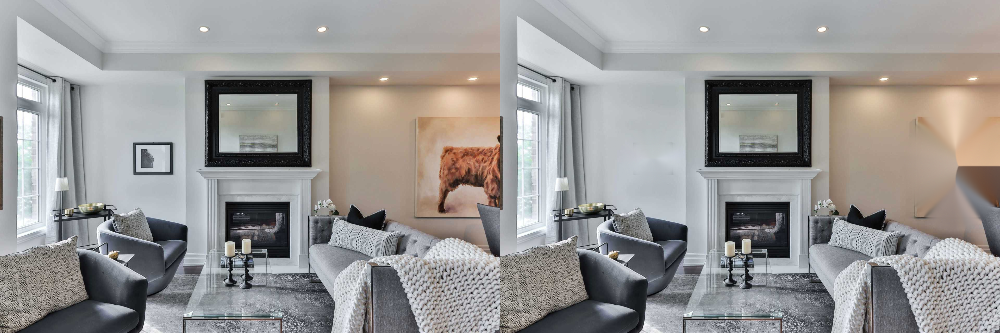

Showing living_room_1p (83).jpg with inpainted class 11 frames...


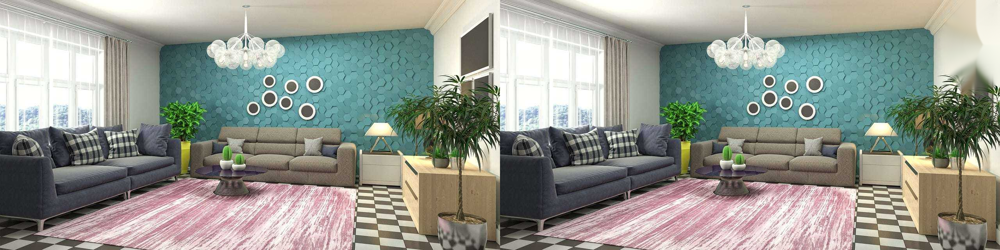

Showing living_room_1457.jpg with inpainted class 11 frames...


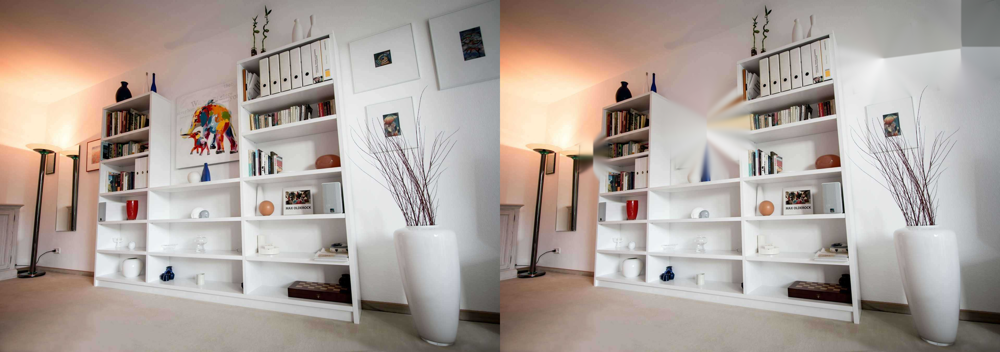

Showing living_room_1303.jpg with inpainted class 11 frames...


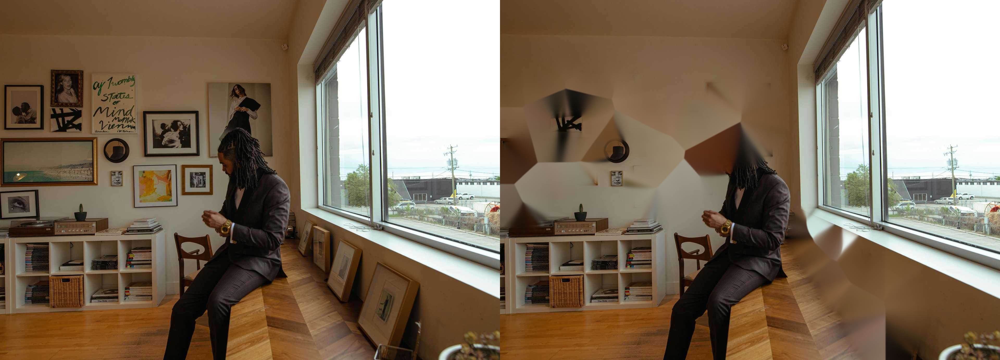

Showing s (328).jpg with inpainted class 11 frames...


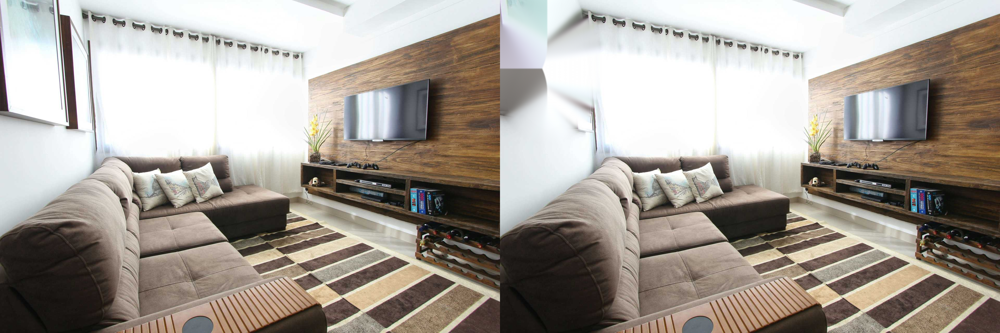

In [ ]:
import os
import random
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Dataset paths - adjust as needed
images_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K/images/train"
labels_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K/labels/train"

def load_labels_yolo_format(label_path):
    boxes = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                cls, xc, yc, w, h = map(float, parts)
                boxes.append([cls, xc, yc, w, h])
    return boxes

def has_class_11(label_path):
    boxes = load_labels_yolo_format(label_path)
    return any(int(box[0]) == 11 for box in boxes)

def inpaint_class_11_with_soft_blend(image_path, label_path, padding=15, ellipse_expand=30,
                                     morph_kernel_size=25, blur_size=101, inpaint_radius=5):
    image = cv2.imread(image_path)
    if image is None:
        print(f"ERROR: Could not load image at {image_path}")
        return
    h, w = image.shape[:2]
    bbox_data = load_labels_yolo_format(label_path)

    # Create binary mask for inpainting
    mask = np.zeros((h, w), dtype=np.uint8)

    for box in bbox_data:
        cls, xc, yc, bw, bh = box
        if int(cls) == 11:
            x1 = int((xc - bw / 2) * w) - padding
            y1 = int((yc - bh / 2) * h) - padding
            x2 = int((xc + bw / 2) * w) + padding
            y2 = int((yc + bh / 2) * h) + padding
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w - 1, x2), min(h - 1, y2)

            center = ((x1 + x2) // 2, (y1 + y2) // 2)
            box_width = x2 - x1
            box_height = y2 - y1
            axes = (box_width // 2 + ellipse_expand, box_height // 2 + ellipse_expand)
            # Draw filled ellipse in mask
            cv2.ellipse(mask, center, axes, 0, 0, 360, 255, thickness=-1)

    # Morphological closing to seal isolated edges
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_kernel_size, morph_kernel_size))
    closed_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Inpaint on the closed mask
    inpainted = cv2.inpaint(image, closed_mask, inpaint_radius, cv2.INPAINT_TELEA)

    # Create blurred alpha mask for soft blending edges
    blurred_alpha = cv2.GaussianBlur(closed_mask.astype(np.float32), (blur_size, blur_size), 0) / 255.0
    alpha_3ch = blurred_alpha[:, :, np.newaxis]

    # Blend inpainted region softly with original image using alpha mask
    blended = (alpha_3ch * inpainted.astype(np.float32) + (1 - alpha_3ch) * image.astype(np.float32)).astype(np.uint8)

    # Display before/after
    comparison = np.hstack((image, blended))
    cv2_imshow(comparison)


# List label files with class 11
all_label_files = [f for f in os.listdir(labels_dir) if f.endswith(".txt")]
files_with_class_11 = [f for f in all_label_files if has_class_11(os.path.join(labels_dir, f))]

num_samples = min(5, len(files_with_class_11))
random.seed(42)
sample_files = random.sample(files_with_class_11, num_samples)

print(f"Processing {num_samples} randomly selected images with class 11...")

for label_fname in sample_files:
    image_fname = os.path.splitext(label_fname)[0] + ".jpg"
    image_path = os.path.join(images_dir, image_fname)
    label_path = os.path.join(labels_dir, label_fname)
    print(f"Showing {image_fname} with inpainted class 11 frames...")
    inpaint_class_11_with_soft_blend(image_path, label_path)


In [ ]:
!cp -r "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked" /content/


In [ ]:
#code from chat I got to automatically check if all the files in my dataset correct
DATASET_ROOT = DATASET_ROOT = "/content/homeobjects-3K-masked"
IMG_EXTS = {".jpg", ".jpeg", ".png"}
LABEL_EXT = ".txt"

# Count classes (should match your YAML)
NUM_CLASSES = 12  # change to match your dataset


def get_files(path, exts):
    return sorted([
        f for f in os.listdir(path)
        if os.path.splitext(f)[1].lower() in exts
    ])

def sanity_check(split):
    print(f"\n=== Checking {split.upper()} split ===")

    img_dir = f"{DATASET_ROOT}/images/{split}"
    label_dir = f"{DATASET_ROOT}/labels/{split}"

    imgs = get_files(img_dir, IMG_EXTS)
    labels = get_files(label_dir, {LABEL_EXT})

    print(f"Images: {len(imgs)}")
    print(f"Labels: {len(labels)}")

    # 1. Check that each image has a label
    missing_labels = []
    for img in imgs:
        base = os.path.splitext(img)[0]
        if f"{base}.txt" not in labels:
            missing_labels.append(img)

    if missing_labels:
        print(f"❌ Missing label files for {len(missing_labels)} images:")
        print(missing_labels[:10])  # show first few
    else:
        print("✅ All images have labels")

    # 3. Validate label formatting
    bad_labels = []
    for label in labels:
        with open(f"{label_dir}/{label}", "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    bad_labels.append((label, "wrong number of items"))
                    break

                cls, x, y, w, h = parts
                try:
                    cls = int(cls)
                    x, y, w, h = map(float, (x, y, w, h))
                except:
                    bad_labels.append((label, "non-numeric values"))
                    break

                if not (0 <= cls < NUM_CLASSES):
                    bad_labels.append((label, f"invalid class {cls}"))
                    break

                if not (0 <= x <= 1 and 0 <= y <= 1 and 0 <= w <= 1 and 0 <= h <= 1):
                    bad_labels.append((label, "bbox values out of range"))
                    break

    if bad_labels:
        print(f"❌ Found {len(bad_labels)} label issues:")
        for b in bad_labels[:10]:
            print(" ", b)
    else:
        print("✅ All label files are correctly formatted")

    print("=== Done ===")


# Run checks on both train and val
sanity_check("train")
sanity_check("val")



=== Checking TRAIN split ===
Images: 2285
Labels: 2285
✅ All images have labels
✅ All label files are correctly formatted
=== Done ===

=== Checking VAL split ===
Images: 404
Labels: 404
✅ All images have labels
✅ All label files are correctly formatted
=== Done ===


In [ ]:
import os

DATASET_ROOT = "/content/homeobjects-3K-masked"  # LOCAL COPY

def fix_labels(split):
    print(f"\n=== Fixing {split.upper()} label files ===")
    label_dir = f"{DATASET_ROOT}/labels/{split}"
    repaired = 0
    removed_lines = 0

    for label_file in os.listdir(label_dir):
        if not label_file.endswith(".txt"):
            continue

        path = f"{label_dir}/{label_file}"

        with open(path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            # We keep only well-formed YOLO lines
            if len(parts) == 5:
                try:
                    cls = int(parts[0])
                    floats = list(map(float, parts[1:]))
                    new_lines.append(line.strip() + "\n")
                except:
                    pass  # malformed number
            else:
                removed_lines += 1

        # If file was modified, overwrite it
        if len(new_lines) != len(lines):
            repaired += 1
            with open(path, "w") as f:
                f.writelines(new_lines)

    print(f"Repaired {repaired} label files")
    print(f"Removed {removed_lines} bad lines")


fix_labels("train")
fix_labels("val")



=== Fixing TRAIN label files ===
Repaired 67 label files
Removed 67 bad lines

=== Fixing VAL label files ===
Repaired 2 label files
Removed 2 bad lines


Dataset scew fixing and augmentation, flipped images

In [ ]:
import os

DATASET_ROOT = "/content/homeobjects-3K-masked"

def count_painting_images(split):
    label_dir = f"{DATASET_ROOT}/labels/{split}"
    total = 0
    with_painting = 0

    for label_file in os.listdir(label_dir):
        if not label_file.endswith(".txt"):
            continue
        total += 1
        path = f"{label_dir}/{label_file}"
        with open(path, "r") as f:
            lines = f.readlines()
            # check if any line has class 11
            if any(line.strip().split()[0] == "11" for line in lines):
                with_painting += 1

    print(f"{split.upper()} split: {with_painting}/{total} images contain paintings ({with_painting/total*100:.1f}%)")

count_painting_images("train")
count_painting_images("val")


TRAIN split: 1062/2285 images contain paintings (46.5%)
VAL split: 211/404 images contain paintings (52.2%)


In [ ]:
import os
import shutil
import random
from PIL import Image

# ===== CONFIG =====
DATASET_ROOT = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked"
TRAIN_IMG_DIR = f"{DATASET_ROOT}/images/train"
TRAIN_LABEL_DIR = f"{DATASET_ROOT}/labels/train"
DUPLICATION_RATIO = 0.73  # fraction of painting images to duplicate

# ===== 1️⃣ Identify all painting images =====
painting_images = []
for label_file in os.listdir(TRAIN_LABEL_DIR):
    if not label_file.endswith(".txt"):
        continue
    with open(os.path.join(TRAIN_LABEL_DIR, label_file)) as f:
        lines = f.readlines()
        # Skip empty lines
        lines = [line for line in lines if line.strip()]
        # Check if any line has class 11 (painting)
        if any(line.strip().split()[0] == "11" for line in lines):
            painting_images.append(label_file)

print(f"{len(painting_images)} images with paintings found.")

# ===== 2️⃣ Select subset to duplicate =====
num_to_duplicate = int(len(painting_images) * DUPLICATION_RATIO)
painting_subset = random.sample(painting_images, num_to_duplicate)
print(f"Duplicating {num_to_duplicate} painting images (~{DUPLICATION_RATIO*100:.1f}%)")

# ===== 3️⃣ Duplicate + Horizontal Flip =====
for label_file in painting_subset:
    base_name = os.path.splitext(label_file)[0]

    # Find image file extension
    img_file = None
    for ext in [".jpg", ".png", ".jpeg"]:
        if os.path.exists(os.path.join(TRAIN_IMG_DIR, base_name + ext)):
            img_file = base_name + ext
            break
    if img_file is None:
        continue

    # Create duplicate
    new_base = f"{base_name}_dup"
    new_img_path = os.path.join(TRAIN_IMG_DIR, f"{new_base}{os.path.splitext(img_file)[1]}")
    new_label_path = os.path.join(TRAIN_LABEL_DIR, f"{new_base}.txt")

    # Copy original image and label
    shutil.copy(os.path.join(TRAIN_IMG_DIR, img_file), new_img_path)
    shutil.copy(os.path.join(TRAIN_LABEL_DIR, label_file), new_label_path)

    # ===== Horizontal Flip =====
    # Flip image
    img = Image.open(new_img_path)
    img_flipped = img.transpose(Image.FLIP_LEFT_RIGHT)
    flip_base = f"{new_base}_flip"
    flipped_img_path = os.path.join(TRAIN_IMG_DIR, f"{flip_base}{os.path.splitext(img_file)[1]}")
    img_flipped.save(flipped_img_path)

    # Flip labels
    with open(new_label_path, "r") as f:
        lines = [line for line in f.readlines() if line.strip()]  # skip empty lines

    flipped_lines = []
    for line in lines:
        parts = line.strip().split()
        cls_id = parts[0]
        x_center = float(parts[1])
        y_center = float(parts[2])
        w = float(parts[3])
        h = float(parts[4])

        # Horizontal flip
        x_center_flipped = 1 - x_center
        flipped_lines.append(f"{cls_id} {x_center_flipped:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

    # Save flipped labels
    flipped_label_path = os.path.join(TRAIN_LABEL_DIR, f"{flip_base}.txt")
    with open(flipped_label_path, "w") as f:
        f.writelines(flipped_lines)


1062 images with paintings found.
Duplicating 775 painting images (~73.0%)


In [ ]:
import os

train_img_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/train"
all_images = [f for f in os.listdir(train_img_dir) if f.endswith((".jpg", ".png", ".jpeg"))]
print(f"Total images in train folder: {len(all_images)}")


Total images in train folder: 3835


In [ ]:
import os

train_img_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/train"
all_images = [f for f in os.listdir(train_img_dir) if f.endswith((".jpg", ".png", ".jpeg"))]
print(f"Total images in train folder: {len(all_images)}")


Total images in train folder: 3835


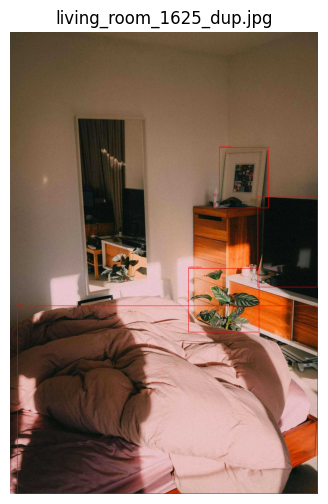

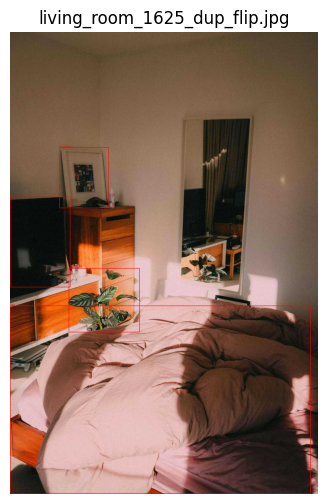

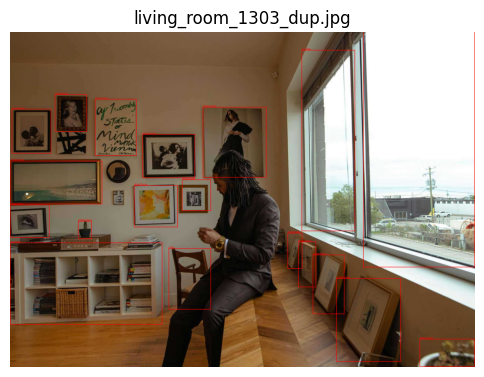

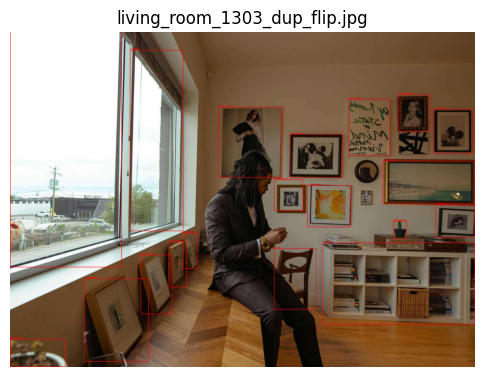

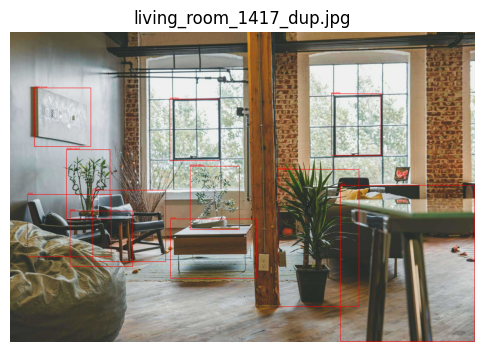

In [ ]:
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Paths
train_img_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/train"
train_label_dir = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/labels/train"

# Classes
classes = {
    "0": "bed",
    "1": "sofa",
    "2": "chair",
    "3": "table",
    "4": "lamp",
    "5": "tv",
    "6": "laptop",
    "7": "wardrobe",
    "8": "window",
    "9": "door",
    "10": "potted plant",
    "11": "photo frame"
}

# List a few augmented images
augmented_images = [f for f in os.listdir(train_img_dir)
                    if ("_dup" in f or "_flip" in f) and f.endswith((".jpg", ".png", ".jpeg"))]

sample_images = augmented_images[:5]  # pick first 5 for visualization

for img_file in sample_images:
    base_name = os.path.splitext(img_file)[0]
    label_file = base_name + ".txt"
    label_path = os.path.join(train_label_dir, label_file)

    # Load image
    img_path = os.path.join(train_img_dir, img_file)
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img)
    width, height = img.size

    # Draw YOLO bounding boxes
    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f.readlines():
                if not line.strip():
                    continue
                cls_id, x_center, y_center, w, h = line.strip().split()
                x_center, y_center, w, h = map(float, (x_center, y_center, w, h))

                # Convert YOLO format to pixel coordinates
                x1 = (x_center - w/2) * width
                y1 = (y_center - h/2) * height
                x2 = (x_center + w/2) * width
                y2 = (y_center + h/2) * height

                draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
                draw.text((x1, y1-10), classes[cls_id], fill="red")

    # Display image
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_file)
    plt.show()


Creating masked images in seperate folder for testing

In [ ]:
import os

folder = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/train"
files = sorted(os.listdir(folder))
print([f for f in files if "_dup" in f or "_flip" in f])


['living_room_1005_dup.jpg', 'living_room_1005_dup_flip.jpg', 'living_room_1011_dup.jpg', 'living_room_1011_dup_flip.jpg', 'living_room_1017_dup.jpg', 'living_room_1017_dup_flip.jpg', 'living_room_1021_dup.jpg', 'living_room_1021_dup_flip.jpg', 'living_room_1026_dup.jpg', 'living_room_1026_dup_flip.jpg', 'living_room_102_dup.jpg', 'living_room_102_dup_flip.jpg', 'living_room_1030_dup.jpg', 'living_room_1030_dup_flip.jpg', 'living_room_1033_dup.jpg', 'living_room_1033_dup_flip.jpg', 'living_room_1048_dup.jpg', 'living_room_1048_dup_flip.jpg', 'living_room_1052_dup.jpg', 'living_room_1052_dup_flip.jpg', 'living_room_1053_dup.jpg', 'living_room_1053_dup_flip.jpg', 'living_room_105_dup.jpg', 'living_room_105_dup_flip.jpg', 'living_room_1061_dup.jpg', 'living_room_1061_dup_flip.jpg', 'living_room_1062_dup.jpg', 'living_room_1062_dup_flip.jpg', 'living_room_106_dup.jpg', 'living_room_106_dup_flip.jpg', 'living_room_1075_dup.jpg', 'living_room_1075_dup_flip.jpg', 'living_room_1078_dup.jpg', '

In [ ]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from tqdm import tqdm
import random

# ===== CONFIG =====
DATASET_ROOT = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked"
IMG_DIRS = {
    "train": os.path.join(DATASET_ROOT, "images/train"),
    "val": os.path.join(DATASET_ROOT, "images/val")
}
LABEL_DIRS = {
    "train": os.path.join(DATASET_ROOT, "labels/train"),
    "val": os.path.join(DATASET_ROOT, "labels/val")
}
SAVE_DIRS = {
    "train": os.path.join(DATASET_ROOT, "images2/train"),
    "val": os.path.join(DATASET_ROOT, "images2/val")
}
NUM_VISUAL_CHECKS = 5  # number of random examples per split
os.makedirs(SAVE_DIRS["train"], exist_ok=True)
os.makedirs(SAVE_DIRS["val"], exist_ok=True)

# ===== FUNCTIONS =====
def load_labels_yolo_format(label_path):
    boxes = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                cls, xc, yc, w, h = map(float, parts)
                boxes.append([cls, xc, yc, w, h])
    return boxes

def has_class_11(label_path):
    boxes = load_labels_yolo_format(label_path)
    return any(int(box[0]) == 11 for box in boxes)

def draw_boxes(img, label_path, color=(0, 0, 255), thickness=2):
    """Draws all boxes from label file on the image (only class 11 for clarity)"""
    h, w = img.shape[:2]
    boxes = load_labels_yolo_format(label_path)
    img_copy = img.copy()
    for box in boxes:
        cls, xc, yc, bw, bh = box
        if int(cls) == 11:
            x1 = int((xc - bw/2) * w)
            y1 = int((yc - bh/2) * h)
            x2 = int((xc + bw/2) * w)
            y2 = int((yc + bh/2) * h)
            cv2.rectangle(img_copy, (x1, y1), (x2, y2), color, thickness)
    return img_copy

def inpaint_class_11_with_soft_blend(image_path, label_path, padding=15, ellipse_expand=30,
                                     morph_kernel_size=25, blur_size=101, inpaint_radius=5):
    image = cv2.imread(image_path)
    if image is None:
        print(f"ERROR: Could not load image at {image_path}")
        return None
    h, w = image.shape[:2]
    bbox_data = load_labels_yolo_format(label_path)

    mask = np.zeros((h, w), dtype=np.uint8)
    for box in bbox_data:
        cls, xc, yc, bw, bh = box
        if int(cls) == 11:
            x1 = int((xc - bw / 2) * w) - padding
            y1 = int((yc - bh / 2) * h) - padding
            x2 = int((xc + bw / 2) * w) + padding
            y2 = int((yc + bh / 2) * h) + padding
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w - 1, x2), min(h - 1, y2)
            center = ((x1 + x2) // 2, (y1 + y2) // 2)
            box_width = x2 - x1
            box_height = y2 - y1
            axes = (box_width // 2 + ellipse_expand, box_height // 2 + ellipse_expand)
            cv2.ellipse(mask, center, axes, 0, 0, 360, 255, thickness=-1)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_kernel_size, morph_kernel_size))
    closed_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    inpainted = cv2.inpaint(image, closed_mask, inpaint_radius, cv2.INPAINT_TELEA)
    blurred_alpha = cv2.GaussianBlur(closed_mask.astype(np.float32), (blur_size, blur_size), 0) / 255.0
    alpha_3ch = blurred_alpha[:, :, np.newaxis]
    blended = (alpha_3ch * inpainted.astype(np.float32) + (1 - alpha_3ch) * image.astype(np.float32)).astype(np.uint8)
    return blended

# ===== PROCESS SPLITS =====
for split in ["train", "val"]:
    img_dir = IMG_DIRS[split]
    label_dir = LABEL_DIRS[split]
    save_dir = SAVE_DIRS[split]

    all_label_files = [f for f in os.listdir(label_dir) if f.endswith(".txt")]
    painting_label_files = [f for f in all_label_files if has_class_11(os.path.join(label_dir, f))]
    print(f"\nProcessing {len(painting_label_files)} images with paintings in {split} split...")

    # Pick random files for visual grid
    visual_check_files = random.sample(painting_label_files, min(NUM_VISUAL_CHECKS, len(painting_label_files)))
    comparison_grid = []

    for label_fname in tqdm(painting_label_files):
        image_fname = os.path.splitext(label_fname)[0] + ".jpg"
        image_path = os.path.join(img_dir, image_fname)
        label_path = os.path.join(label_dir, label_fname)

        # Masked image
        masked_img = inpaint_class_11_with_soft_blend(image_path, label_path)
        if masked_img is not None:
            save_path = os.path.join(save_dir, image_fname)
            cv2.imwrite(save_path, masked_img)

            # Visual sanity check
            if label_fname in visual_check_files:
                original = cv2.imread(image_path)
                original_with_boxes = draw_boxes(original, label_path)
                masked_with_boxes = draw_boxes(masked_img, label_path, color=(0, 255, 0))
                comparison = np.hstack((original_with_boxes, masked_with_boxes))
                comparison_grid.append(comparison)

    # Stack selected comparisons vertically
    if comparison_grid:
        grid_image = np.vstack(comparison_grid)
        cv2_imshow(grid_image)
        print(f"Displayed {len(comparison_grid)} random examples from {split} split with label overlays.")



Processing 2612 images with paintings in train split...


100%|██████████| 2612/2612 [40:58<00:00,  1.06it/s]


ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 2560 and the array at index 1 has size 3840

Visualization function errored above, but it did correctly make the images I wanted for the train set

In [ ]:
import os
import cv2
import numpy as np

# ===== CONFIG =====
VAL_IMG_DIR = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/val"
VAL_LABEL_DIR = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/labels/val"
SAVE_DIR = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images2/val"

os.makedirs(SAVE_DIR, exist_ok=True)

# ===== FUNCTIONS =====
def load_labels_yolo_format(label_path):
    boxes = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                cls, xc, yc, w, h = map(float, parts)
                boxes.append([cls, xc, yc, w, h])
    return boxes

def inpaint_class_11(image_path, label_path, padding=15, ellipse_expand=30,
                      morph_kernel_size=25, inpaint_radius=5):
    image = cv2.imread(image_path)
    if image is None:
        print(f"ERROR: Could not load image at {image_path}")
        return None
    h, w = image.shape[:2]
    bbox_data = load_labels_yolo_format(label_path)

    mask = np.zeros((h, w), dtype=np.uint8)

    for box in bbox_data:
        cls, xc, yc, bw, bh = box
        if int(cls) == 11:
            x1 = int((xc - bw / 2) * w) - padding
            y1 = int((yc - bh / 2) * h) - padding
            x2 = int((xc + bw / 2) * w) + padding
            y2 = int((yc + bh / 2) * h) + padding
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w - 1, x2), min(h - 1, y2)

            center = ((x1 + x2) // 2, (y1 + y2) // 2)
            axes = ((x2 - x1) // 2 + ellipse_expand, (y2 - y1) // 2 + ellipse_expand)
            cv2.ellipse(mask, center, axes, 0, 0, 360, 255, thickness=-1)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_kernel_size, morph_kernel_size))
    closed_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    inpainted = cv2.inpaint(image, closed_mask, inpaint_radius, cv2.INPAINT_TELEA)
    return inpainted

# ===== PROCESS VAL IMAGES =====
val_label_files = [f for f in os.listdir(VAL_LABEL_DIR) if f.endswith(".txt")]
painting_files = []

for label_file in val_label_files:
    label_path = os.path.join(VAL_LABEL_DIR, label_file)
    boxes = load_labels_yolo_format(label_path)
    if any(int(box[0]) == 11 for box in boxes):
        painting_files.append(label_file)

print(f"Processing {len(painting_files)} images with paintings in val split...")

for label_file in painting_files:
    image_fname = os.path.splitext(label_file)[0] + ".jpg"
    image_path = os.path.join(VAL_IMG_DIR, image_fname)
    label_path = os.path.join(VAL_LABEL_DIR, label_file)
    masked_image = inpaint_class_11(image_path, label_path)
    if masked_image is not None:
        save_path = os.path.join(SAVE_DIR, image_fname)
        cv2.imwrite(save_path, masked_image)

print("Done processing validation images.")


Processing 211 images with paintings in val split...
Done processing validation images.


Replacing original images with masked versions

In [ ]:
import os
import shutil

# ===== CONFIG =====
DATASET_ROOT = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked"
SPLITS = ["train", "val"]
ORIGINAL_IMG_DIR = os.path.join(DATASET_ROOT, "images")
MASKED_IMG_DIR = os.path.join(DATASET_ROOT, "images2")

for split in SPLITS:
    original_split_dir = os.path.join(ORIGINAL_IMG_DIR, split)
    masked_split_dir = os.path.join(MASKED_IMG_DIR, split)

    if not os.path.exists(masked_split_dir):
        print(f"No masked images for {split} found at {masked_split_dir}, skipping...")
        continue

    masked_files = [f for f in os.listdir(masked_split_dir) if f.lower().endswith((".jpg", ".png", ".jpeg"))]

    for f in masked_files:
        src = os.path.join(masked_split_dir, f)
        dst = os.path.join(original_split_dir, f)
        shutil.copy2(src, dst)  # copy2 preserves metadata
    print(f"Replaced {len(masked_files)} images in {split} split with masked versions.")


Replaced 2612 images in train split with masked versions.
Replaced 211 images in val split with masked versions.


In [ ]:
import os

# Paths
ORIGINAL_TRAIN = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/train"
ORIGINAL_VAL = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images/val"
MASKED_TRAIN = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images2/train"
MASKED_VAL = "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/images2/val"

def check_replacement(original_dir, masked_dir):
    original_files = set(os.listdir(original_dir))
    masked_files = set(os.listdir(masked_dir))

    # 1️⃣ Check no extra files were added
    extra_files = masked_files - original_files
    if extra_files:
        print(f"Warning: Extra files in masked folder: {extra_files}")
    else:
        print("No extra files found in masked folder ✅")

    # 2️⃣ Check all original files are present in masked folder
    missing_files = original_files - masked_files
    if missing_files:
        print(f"Error: Some original files are missing in masked folder: {missing_files}")
    else:
        print("All original files present in masked folder ✅")

    # 3️⃣ Optionally, check file counts
    print(f"Original files: {len(original_files)}, Masked files: {len(masked_files)}")

print("Checking TRAIN set...")
check_replacement(ORIGINAL_TRAIN, MASKED_TRAIN)

print("\nChecking VAL set...")
check_replacement(ORIGINAL_VAL, MASKED_VAL)


Checking TRAIN set...
No extra files found in masked folder ✅
Error: Some original files are missing in masked folder: {'living_room_1870.jpg', 'living_room_1569.jpg', 'living_room_340.jpg', 'living_room_1876.jpg', 's (136).jpg', 'living_room_122.jpg', 'living_room_1p (309).jpg', 'living_room_1387.jpg', 'living_room_1p (485).jpg', 'living_room_330.jpg', 's (309).jpg', 'living_room_1443.jpg', 'living_room_1242.jpg', 'living_room_1466.jpg', 'living_room_179.jpg', 's (398).jpg', 'living_room_1p (463).jpg', 'living_room_1687.jpg', 'living_room_1p (346).jpg', 'living_room_1789.jpg', 'living_room_157.jpg', 's (276).jpg', 'living_room_1p (591).jpg', 'living_room_1276.jpg', 'living_room_559.jpg', 'living_room_633.jpg', 'living_room_1856.jpg', 'living_room_1120.jpg', 'living_room_1712.jpg', 'living_room_173.jpg', 'living_room_889.jpg', 'living_room_1440.jpg', 'living_room_1163.jpg', 'living_room_1p (108).jpg', 'living_room_321.jpg', 'living_room_1309.jpg', 'living_room_919.jpg', 's (316).jpg', 

In [ ]:
!rm -rf /content/datasets/homeobjects




In [ ]:
!mkdir -p /content/datasets/homeobjects


In [ ]:
!cp -r "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/" /content/datasets/homeobjects/


^C


In [ ]:
!ls -R /content/datasets/homeobjects/homeobjects-3K-masked/HomeObjects-3K-masked.yaml


/content/datasets/homeobjects/homeobjects-3K-masked/HomeObjects-3K-masked.yaml


Running model

In [ ]:
!rsync -av "/content/drive/My Drive/SmartSpace/homeobjects-3K-masked/" /content/datasets/homeobjects/

In [ ]:
!pip install -U ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load pretrained YOLOv8 model (pretrained on COCO)
model = YOLO('yolov8n.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
results = model.train(
    data='/content/datasets/homeobjects/homeobjects-3K-masked/HomeObjects-3K-masked.yaml',
    epochs=5,          # fewer epochs to check pipeline
    imgsz=320,         # smaller image size speeds up testing
    batch=8,
    device=0,
    name='test_yolov8n'
    #evolve=True
    #cv=5
)

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/homeobjects/homeobjects-3K-masked/HomeObjects-3K-masked.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=test_yolov8n3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr

In [ ]:
inference_results = model.predict(
    source='/content/datasets/homeobjects/homeobjects-3K-masked/images/val',
    classes=[11],   # photo frames
    imgsz=640,
    conf=0.25,
    save=True,      # saves results in /content/runs/detect/predict
    save_txt=False, # optional
    show=True       # display images in notebook
)



WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


image 1/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_10.jpg: 640x448 (no detections), 58.7ms
image 2/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1000.jpg: 640x640 (no detections), 8.4ms
image 3/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1004.jpg: 640x480 (no detections), 58.7ms
image 4/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1008.jpg: 448x640 1 photo frame, 58.3ms
image 5/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1012.jpg: 448x640 5 photo frames, 8.7ms
image 6/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1016.jpg: 448x640 1 photo frame, 9.5ms
image 7/404 /content/datasets/homeobjects/homeobjects-3K-masked/images/val/living_room_1020.jpg: 448x640 2 photo frames, 7.7ms
image 8/404 /content/datasets/home